# Raw data

In [1]:
# ls ../data/raw

In [3]:
import os
from pathlib import Path

directory = "../data/raw/"
filenames = []

for filename in os.listdir(directory):
    file_path = os.path.join(directory, filename)  # Полный путь к файлу
    if os.path.isfile(file_path):  # Проверка, что это файл (не папка)
        # if "Aguiar_Gopinath_2007" in filename:
        filenames.append("../data/raw/" + filename)
filenames[:5]

['../data/raw/RBC_capitalstock_shock_f6b508f9298d2ecda38ee4e6366ce063c9a843c931409238c01e4a7a50771375.csv',
 '../data/raw/RBC_capitalstock_shock_8229a6a9c1f617268aed70f09798d9182faf659f78e42ef23993bae01b8278c4.csv',
 '../data/raw/RBC_capitalstock_shock_e119c6bcf426a017830ce7b6486979a7fbdf5629a53430aab87c3e9f76cd9a52.csv',
 '../data/raw/RBC_capitalstock_shock_e19d8af6bfbcb2c83f3b26660ecacc722cdd1c42a1dfd623d349845a1826e161.csv',
 '../data/raw/RBC_capitalstock_shock_19f7b671eebbae40d05174f8ef91f893997a47d0cc9bd4407fc6e6983405ff6f.csv']

In [4]:
import pandas as pd

raw_data = pd.read_csv("../data/raw/RBC_capitalstock_shock_f6b508f9298d2ecda38ee4e6366ce063c9a843c931409238c01e4a7a50771375.csv")
raw_data.head()

,Output,Consumption,Capital,Hours Worked,Total Factor Productivity,Investment
0,0.051920,-0.257326,2.387070,-1.108663,0.000000,-1.272339
1,-2.557805,-1.095810,1.960726,-2.295394,-1.675442,-8.769624
2,-3.191955,-1.308583,1.838834,-2.577717,-2.080533,-10.566524
3,-2.007638,-1.341375,1.194604,-1.762254,-1.227061,-6.023715
4,0.595502,-0.873449,0.873091,-0.331660,0.527185,2.471332


# Processed data

In [34]:
# ls ../data/processed

In [35]:
import pandas as pd

pd.read_parquet("../data/processed/SGU_2003_config_17.parquet")

FileNotFoundError: [Errno 2] No such file or directory: '../data/processed/SGU_2003_config_17.parquet'

# Dynamics from processed data (a.k.a RL transitions)

In [8]:
import hydra
from lib.plots import plot_state_steps, plot_action_steps

In [9]:
config_path = "../dynare/conf/"
config_name = "config"

with hydra.initialize(version_base=None, config_path=config_path):
    config = hydra.compose(config_name=config_name)

plot_state_steps(transitions, config.Gali_2008_chapter_2.rl_env_settings)

## Validation: Dynamics from raw data

In [46]:
import numpy as np

model_1, model_2 = np.random.choice(filenames, 2)
model_1, model_2

(np.str_('../data/raw/Aguiar_Gopinath_2007_ea079c7695f73e19a483d4b501278fe6d51bd8335cd51ae7634a4616e7993813.csv'),
 np.str_('../data/raw/Aguiar_Gopinath_2007_2970ddeafbcb97060ed23946ea1d268fbed62b4ff6800d73566abe481c86a8ad.csv'))

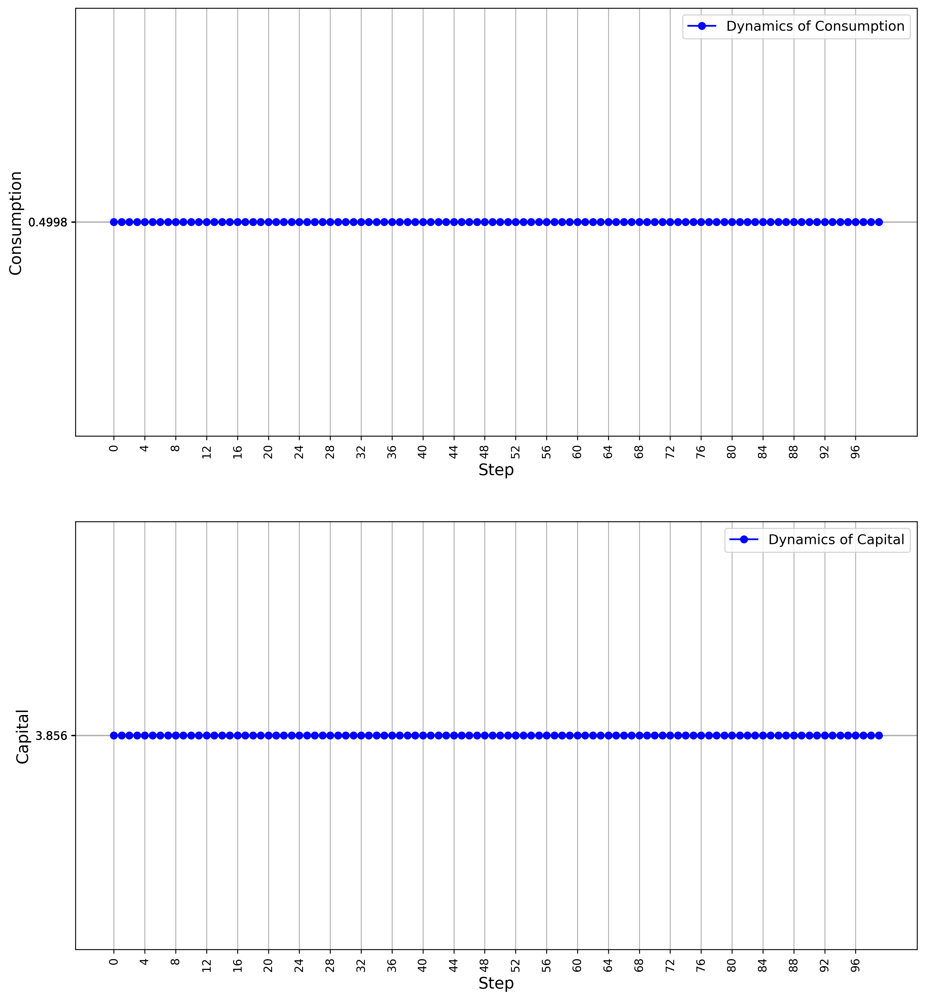

In [47]:
import matplotlib.pyplot as plt
import numpy as np


raw_data = pd.read_csv(model_1).head(100)

columns = raw_data.columns[:2]

fig, axes = plt.subplots(nrows=len(columns), ncols=1, figsize=(13.33, 7.5 * len(columns)), dpi=300)

for idx, column in enumerate(columns):
    
    
    column_values = raw_data[column].to_numpy()
    
    steps = np.arange(len(column_values))
    
    ax = axes[idx]
    
    ax.plot(steps, column_values, marker='o', color='blue', label=f"Dynamics of {column}")
    
    # for i in range(0, len(steps), 4):
    #     ax.text(steps[i], column_values[i], f"R={rewards[i]:.2f}", fontsize=9, color='red', ha='right')
    
    ax.legend(fontsize=12)
    ax.set_xlabel("Step", fontsize=14)
    ax.set_ylabel(f"{column}", fontsize=14)
    ax.set_xticks(steps[::4])

    y_min = np.min(column_values)
    y_max = np.max(column_values)
    y_ticks = np.linspace(y_min, y_max, 20)

    ax.set_yticks(y_ticks)
    ax.set_xticklabels(ax.get_xticks(), rotation=90)
    ax.grid(True)


In [28]:
initval = raw_data["Capital"].to_numpy()[0]



In [30]:
(raw_data["Capital"].to_numpy() == initval).sum()

np.int64(1)

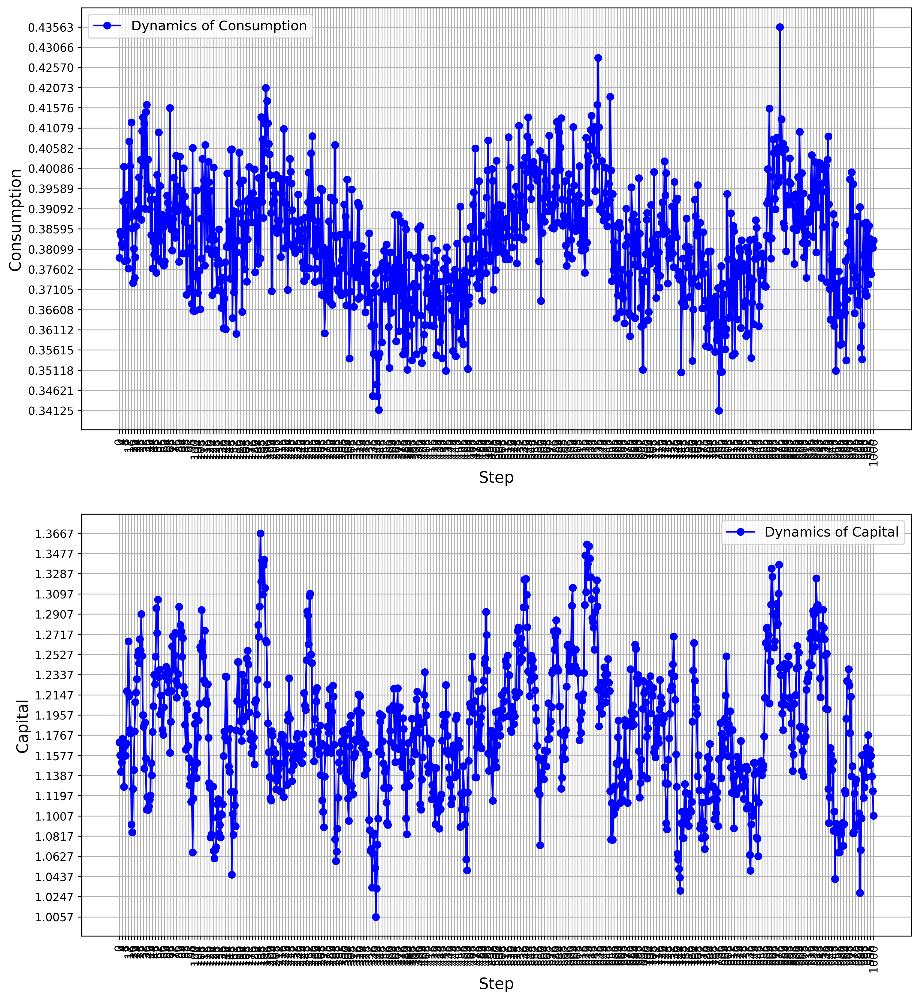

In [26]:
raw_data = pd.read_csv(model_2).head(5000)

columns = raw_data.columns[:2]

fig, axes = plt.subplots(nrows=len(columns), ncols=1, figsize=(13.33, 7.5 * len(columns)), dpi=300)

for idx, column in enumerate(columns):
    
    
    column_values = raw_data[column].to_numpy()
    
    steps = np.arange(len(column_values))
    
    ax = axes[idx]
    
    ax.plot(steps, column_values, marker='o', color='blue', label=f"Dynamics of {column}")
    
    # for i in range(0, len(steps), 4):
    #     ax.text(steps[i], column_values[i], f"R={rewards[i]:.2f}", fontsize=9, color='red', ha='right')
    
    ax.legend(fontsize=12)
    ax.set_xlabel("Step", fontsize=14)
    ax.set_ylabel(f"{column}", fontsize=14)
    ax.set_xticks(steps[::4])

    y_min = np.min(column_values)
    y_max = np.max(column_values)
    y_ticks = np.linspace(y_min, y_max, 20)

    ax.set_yticks(y_ticks)
    ax.set_xticklabels(ax.get_xticks(), rotation=90)
    ax.grid(True)

## Looks Good To Me

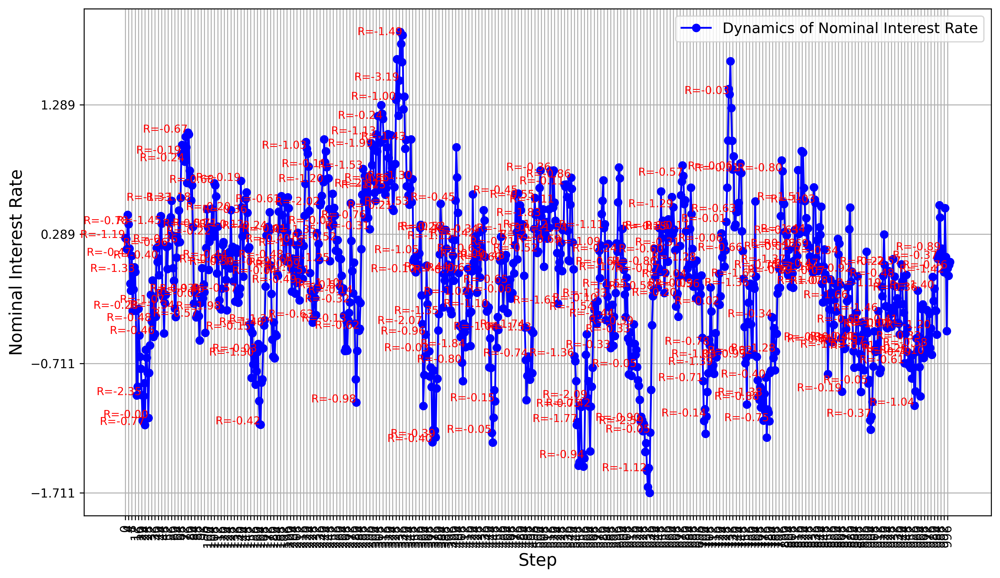

In [12]:
config_path = "../dynare/conf/"
config_name = "config"

with hydra.initialize(version_base=None, config_path=config_path):
    config = hydra.compose(config_name=config_name)

plot_action_steps(transitions, config.Gali_2008_chapter_2.rl_env_settings)

## Validation: Dynamics from raw data

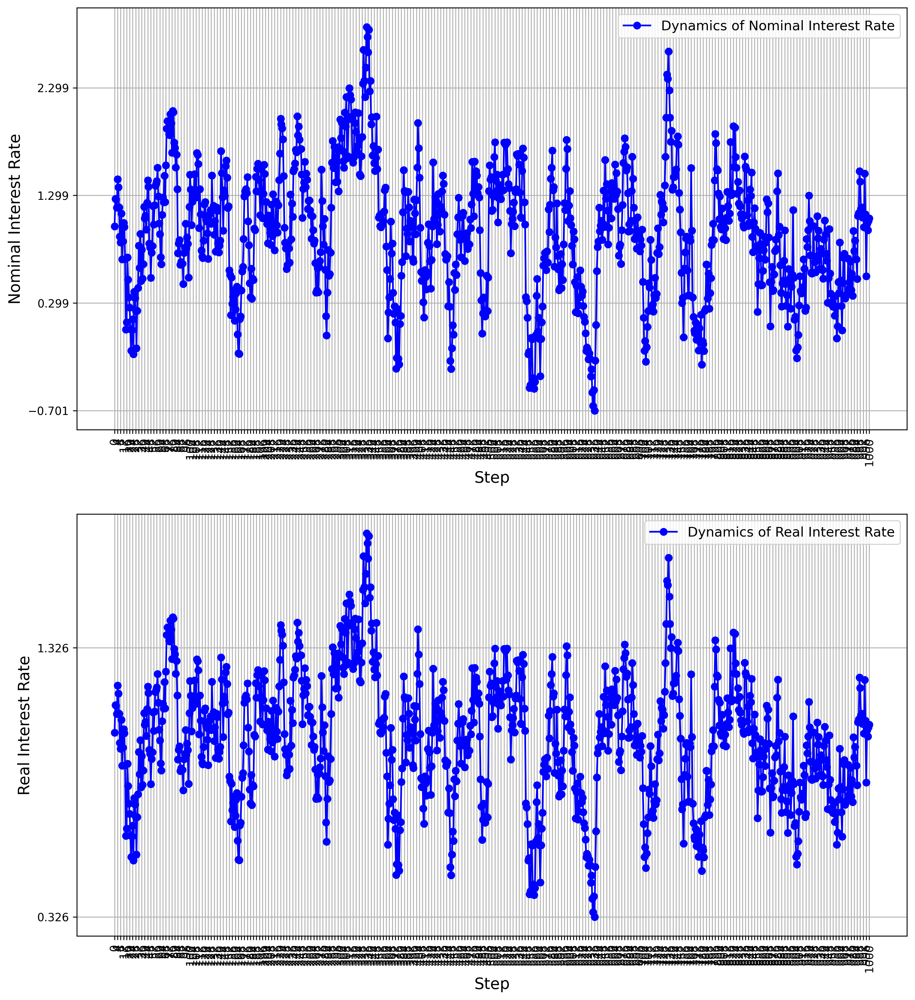

In [13]:
import matplotlib.pyplot as plt
import numpy as np

columns = ["Nominal Interest Rate", "Real Interest Rate"]

fig, axes = plt.subplots(nrows=len(columns), ncols=1, figsize=(13.33, 7.5 * len(columns)), dpi=300)

for idx, column in enumerate(columns):
    
    
    column_values = raw_data[column].to_numpy()
    
    steps = np.arange(len(column_values))
    
    ax = axes[idx]
    
    ax.plot(steps, column_values, marker='o', color='blue', label=f"Dynamics of {column}")
    
    
    ax.legend(fontsize=12)
    ax.set_xlabel("Step", fontsize=14)
    ax.set_ylabel(f"{column}", fontsize=14)
    ax.set_xticks(steps[::4])
    ax.set_yticks(np.arange(np.min(column_values), np.max(column_values)))
    ax.set_xticklabels(ax.get_xticks(), rotation=90)
    ax.grid(True)

## Looks Good To Me

In [14]:
from lib.plots import plot_rewards

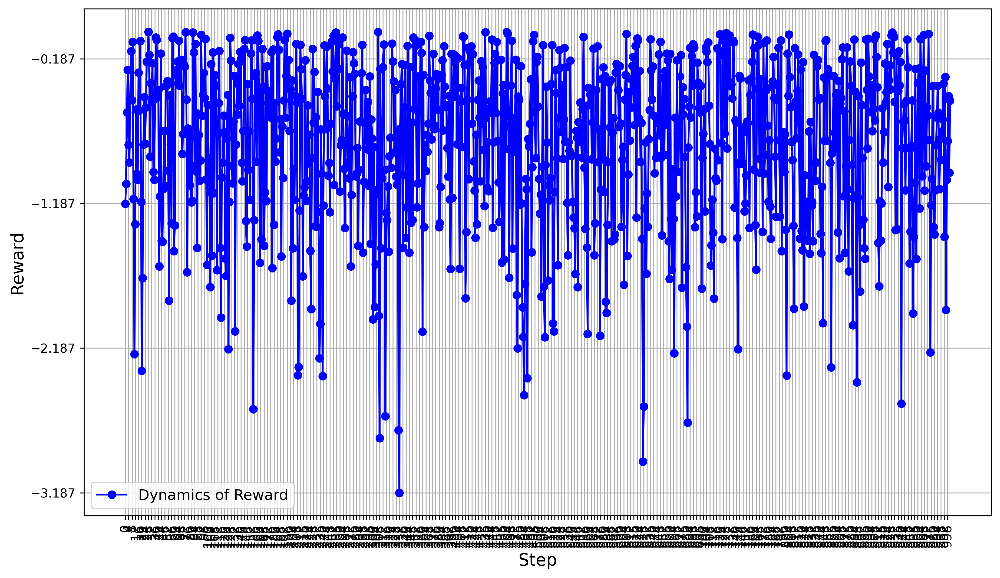

In [15]:
plot_rewards(transitions)